# Calibrated microscopy in MEFL
### Dataset: `MicroTASBE/2D_Data/ColorControls/Kiwimagi06302020`

This notebook demonstrates calibration of microscopy images to MEFL units. We use a fork of Brian Teague's [cytoflow](https://cytoflow.github.io/) that is capable of reading `pandas.DataFrame`s. The fork is located at:
https://github.com/tim-tx/cytoflow-microscopy. You need your Python kernel to load this version of cytoflow for the notebook to work. You will probably want to use Pipenv or a conda environment.

This notebook is intended for reuse. Run the cells up to the Data section, and then read the description carefully for loading your own data. Inspect each subsequent cell as you work through the notebook, as other parameters may need adjustment based on your dataset.

<span style="color:red">***Description of what data are needed and how to run CellProfiler.***</span>

## Preliminaries

(Optional) Instructions for connecting via other Jupyter applications. Console (IPython) sessions can be useful for debugging or scratch work.

In [36]:
%connect_info

{
  "shell_port": 40227,
  "iopub_port": 55249,
  "stdin_port": 46711,
  "control_port": 56325,
  "hb_port": 59243,
  "ip": "127.0.0.1",
  "key": "a87b0b10-d85dbe900c6312ac948e7343",
  "transport": "tcp",
  "signature_scheme": "hmac-sha256",
  "kernel_name": ""
}

Paste the above JSON into a file, and connect with:
    $> jupyter <app> --existing <file>
or, if you are local, you can connect with just:
    $> jupyter <app> --existing kernel-3086438d-3cf1-407c-b766-308fa710d8b6.json
or even just:
    $> jupyter <app> --existing
if this is the most recent Jupyter kernel you have started.


Import Python modules.

In [37]:
import cytoflow as flow
from cytoflow.utility.logicle_scale import LogicleMajorLocator, LogicleMinorLocator

import matplotlib.pyplot as plt
import matplotlib
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from matplotlib.ticker import LogLocator

import skimage.io
import skimage.feature
import skimage.morphology

import numpy as np
import pandas as pd
from scipy.stats import gmean

import re
import os
import sys
import pickle

# test to make sure we have the modified cytoflow loaded
try:
    # these should fail if the original version is loaded
    bl_op = flow.BleedthroughPiecewiseOp()
    bl_op.controls_frames = {}
except:
    if "cytoflow" in sys.modules:
        raise ImportError("Looks like you're not loading the version of cytoflow modified for CSV input.")
        
%matplotlib inline

Plot parameters.

In [38]:
fontsize  = 14
titlesize = 16

golden = np.array([(1 + 5 ** 0.5) / 2, 1])
plt.rc("font", size=fontsize, family="sans-serif", weight="normal")
plt.rc("axes", titlesize=titlesize, labelsize=fontsize)
plt.rc("xtick", labelsize=fontsize)
plt.rc("ytick", labelsize=fontsize)
plt.rc("figure", figsize=5*golden)

## Optical bias

In [39]:
path = "/home/lab/work/postdoc/communication/workspace/200727_124950_Slides"
norm = {
    'r': np.loadtxt(path + "/norm-red.txt"),
    'g': np.loadtxt(path + "/norm-green.txt"),
    'b': np.loadtxt(path + "/norm-blue.txt")
}

## Beads

### Bead radius

Below we set the bead radius in pixels. This is needed to size the mask properly. You should set this appropriately based on the resolution of the microscope and the size of the beads.

All the images in this notebook were taken with a Cytation 5 microscope with a Grasshopper3 GS3-U3-14S5M camera. The images contain the following metadata (found with `exiftool <some_image>.tif`):

```xml
<PixelWidth>1224</PixelWidth>
<PixelHeight>904</PixelHeight>
<ImageWidthMicrons>1973</ImageWidthMicrons>
<ImageHeightMicrons>1457</ImageHeightMicrons>
```

So we find the image resolution $$\frac{1224}{1973} \simeq \frac{904}{1457} \simeq 0.62\;\text{pixels per micron}$$

For a bead diameter of 6 µm, the bead radius in pixels is $$r = 0.62\;\frac{\text{px}}{\text{µm}} \cdot \frac{1}{2}(6\;\text{µm}) = 1.86\;\text{px}$$

Of course we can only have integral numbers of pixels but this is corrected for when the bead mask is constructed.

In [40]:
bead_radius = 1.86  # bead radius in pixels
bead_radius = 2.5

### Load images

In [41]:
path = "/home/lab/work/postdoc/communication/workspace/Kiwimagi06302020/CytationData/200701_101120_07.1/200701_101120_Plate 1"
im_beads = {
    'p': skimage.io.imread_collection(os.path.join(path, "[AB]6*Phase*.tif")),
    'r': skimage.io.imread_collection(os.path.join(path, "[AB]6*Texas Red*.tif")),
    'g': skimage.io.imread_collection(os.path.join(path, "[AB]6*GFP*.tif")),
    'b': skimage.io.imread_collection(os.path.join(path, "[AB]6*TagBFP*.tif"))
}

### Brighten images

It's hard to see the beads by eye most of the time without manipulating the image. When displaying images and locating beads, we force the color map to have a maximum at 2.5% of the maximum brightness in the original image. *We always perform measurements on the original image.*

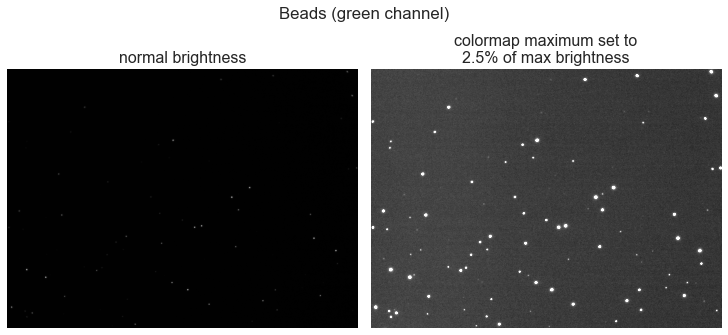

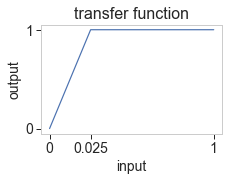

In [42]:
cutoff = 0.025

# image used in example
im = im_beads['g'][2] / norm['g']

fig = plt.figure(constrained_layout=True, figsize=(10,5))
spec = gridspec.GridSpec(nrows=1, ncols=2, figure=fig)

a = fig.add_subplot(spec[0, 0])
a.imshow(im, aspect="equal", cmap=cm.Greys_r)
#plt.title('normal brightness')
a.set_title("normal brightness")
a.axis("off")

b = fig.add_subplot(spec[0, 1])
b.imshow(im, aspect="equal", vmax=cutoff*np.max(im), cmap=cm.Greys_r)
b.set_title("colormap maximum set to\n2.5% of max brightness")
b.axis("off")

fig.suptitle("Beads (green channel)")

fig, ax = plt.subplots(figsize=(2*golden))
tick = cutoff if cutoff >= 0.25 else 0.25
plt.plot([0, tick, 1], [0, 1, 1])
ax.set_xticks([0, tick, 1])
ax.set_xticklabels([0, cutoff, 1])
ax.set_yticks([0, 1])
ax.grid(False)
plt.xlabel("input")
plt.ylabel("output")
plt.title("transfer function")

pass

### Remove artifacts

Sometimes images contain the well edges. The bead finding routine is not smart enough to recognize these and including them will result in a ton of spurious beads being identified. One solution might be to mask off these regions manually or with some sort of automatic recognition, but for now we just ignore the entire image if it contains a well edge. Look through the list below and note the indices of images that have artifacts. A scratch on the well or some other debris that appears in the phase contrast image may not appear in the "fluorescence" channels.

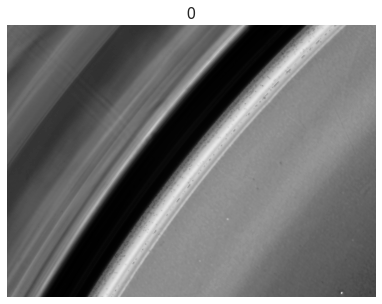

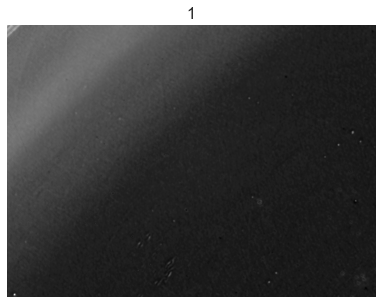

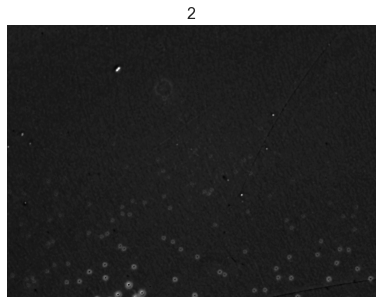

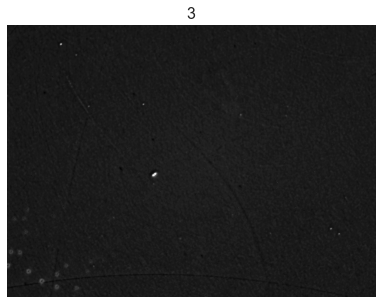

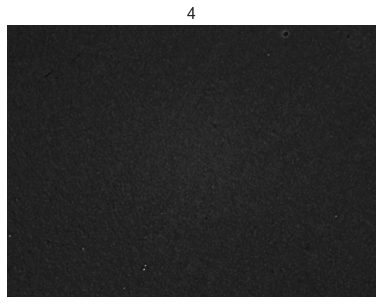

...

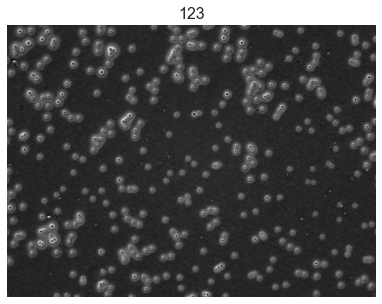

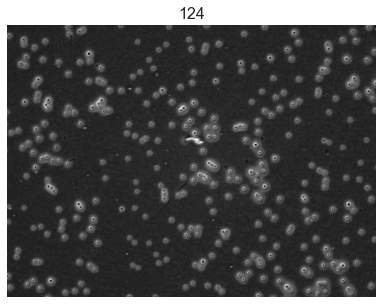

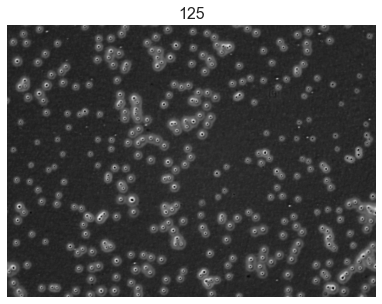

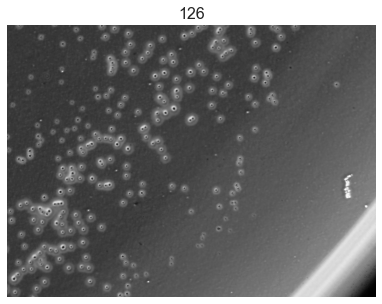

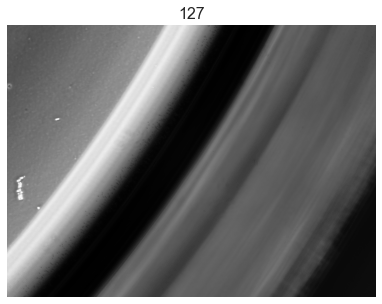

In [43]:
for i, im in enumerate(im_beads['p']):
    fig, ax = plt.subplots()
    plt.imshow(im_beads['p'][i], cm.Greys_r)
    plt.axis("off")
    plt.title(i)
    plt.show()

Below are the indices of images we will ignore.

In [44]:
idx_bad = [0,1,6,7,8,15,16,23,31,39,47,48,55,56,62,63,64,65,70,71,72,79,80,87,95,103,104,111,112,119,120,126,127]

idx_mask = np.ones(len(im_beads['g']), dtype=bool)
idx_mask[idx_bad] = False
idx = np.where(idx_mask)[0]

### Locate beads

We use the [Laplacian of Gaussian](https://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.blob_log) method in `scikit-image` to find (*x,y*) coordinates of the beads. This method isn't implemented in CellProfiler, and though there likely is a workable solution to locating the bead centers in that software, we the authors find the method below convenient and sufficient. (It is also slow.)

In [45]:
blobs = []
vmax = 0.025*np.max(im_beads['g'])
for i, im in enumerate(im_beads['g']):
    if i in idx_bad:
        continue
    im_clip = np.clip(im, 0, vmax)
    blobs.append(skimage.feature.blob_log(im_clip, threshold=100, min_sigma=5, max_sigma=8))

### Sample location plots

In this section we plot some examples of the bead location process.

Some parameters for plots.

In [46]:
im_num = 0    # image number to plot
bead_num = 5  # bead number in the frame to highlight
d = 15        # plot dimension (half-width) for single-bead plot
alpha = 0.4   # opacity of bead mask

Plot bead locations in one frame. We zoom in on the bead highlighted in red in a different plot.

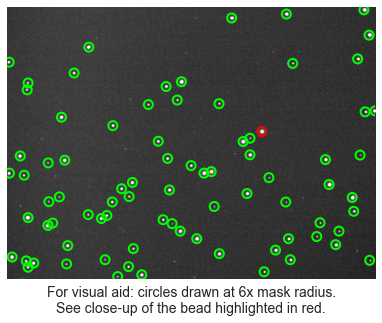

In [47]:
scale = 6       # multiple of the bead radius for highlighting
color1 = "red"  # color to mark the bead that we zoom in on
color2 = "lime" # color to mark all other beads

fig, ax = plt.subplots(figsize=(10,5))

im_clip = np.clip(im_beads['g'][idx[im_num]], 0, vmax)

plt.imshow(im_clip, cmap=cm.Greys_r)
plt.axis("off")
for i, blob in enumerate(blobs[im_num]):
    y, x, r = blob
    color = color1 if i == bead_num else color2
    c = plt.Circle((x, y), bead_radius*scale, color=color, linewidth=2, fill=False)
    ax.add_patch(c)

plt.text(0.5, -0.025, f"For visual aid: circles drawn at {scale}x mask radius.\nSee close-up of the bead highlighted in {color1}.",
         ha="center", va="top", transform=ax.transAxes)

pass

Zoom in on one bead.

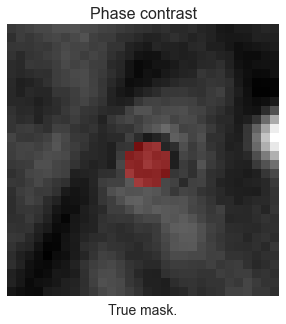

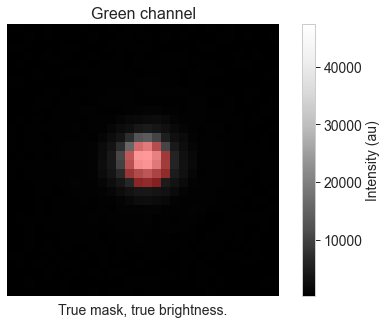

In [48]:
blob = blobs[im_num][bead_num]
y, x, r = blob
xi, yi = np.meshgrid(range(im_beads['g'][0].shape[1]), range(im_beads['g'][0].shape[0]))
mask = (xi-x)**2 + (yi-y)**2 <= bead_radius**2
# draw the mask border instead
#mask = skimage.morphology.binary_dilation(mask) ^ mask

xs = slice(int(x-d), int(x+d))
ys = slice(int(y-d), int(y+d))
im_mask = np.ma.masked_equal(mask[ys, xs]*1.0, 0.)

fig, ax = plt.subplots()
plt.axis("off")
im_trunc = im_beads['p'][idx[im_num]][ys, xs]
plt.imshow(im_trunc, cmap=cm.Greys_r)
plt.imshow(im_mask, cmap=cm.bwr_r, alpha=alpha)
plt.title("Phase contrast", fontsize=16)
plt.text(0.5, -0.025, "True mask.",
         ha="center", va="top", transform=ax.transAxes)

fig,ax = plt.subplots()
plt.axis("off")
im_trunc = im_clip[ys, xs]
im_trunc = im_beads['g'][idx[im_num]][ys, xs]
plt.imshow(im_trunc, cm.Greys_r)
plt.colorbar(label="Intensity (au)")
plt.imshow(im_mask, cmap=cm.bwr_r, alpha=alpha)
plt.title("Green channel", fontsize=16)
plt.text(0.5, -0.025, "True mask, true brightness.", 
         ha="center", va="top", transform=ax.transAxes)

pass

In [49]:
im = im_beads['g'][idx[im_num]][mask]
print(f"Pixel intensities: {im}")
print(f"Integrated intensity (sum): {np.sum(im)}")
print(f"Mean intensity: {np.mean(im):.2f}")

Pixel intensities: [28368 33072 20784 23296 45568 47344 35344 14976 21440 40960 44768 32528
 15360 13648 19728 23072 17712 10800  9728 10880  8336]
Integrated intensity (sum): 517712
Mean intensity: 24652.95


### Measure bead intensities

This is rather slow. There might be room for optimization.

In [50]:
xi, yi = np.meshgrid(range(im_beads['g'][0].shape[1]),range(im_beads['g'][0].shape[0]))
intensity = {
    'r': [],
    'g': [],
    'b': []
}
for j in range(len(blobs)):
    empty = np.zeros(blobs[j].shape[0])
    intensity['g'].append(empty.copy())
    intensity['b'].append(empty.copy())
    intensity['r'].append(empty.copy())
    im = {c: im_beads[c][idx[j]]/norm[c] for c in ('g', 'b', 'r')}
    for i, blob in enumerate(blobs[j]):
        y, x, r = blob
        mask = (xi-x)**2 + (yi-y)**2 <= bead_radius**2
        intensity['g'][-1][i] = np.sum(im['g'][mask])
        intensity['b'][-1][i] = np.sum(im['b'][mask])
        intensity['r'][-1][i] = np.sum(im['r'][mask])

In [51]:
df_beads = pd.DataFrame()
df_beads['Intensity_IntegratedIntensity_green'] = np.hstack(intensity['g'])
df_beads['Intensity_IntegratedIntensity_blue']  = np.hstack(intensity['b'])
df_beads['Intensity_IntegratedIntensity_red']   = np.hstack(intensity['r'])

In [52]:
def plot_histogram(df, color='g', alpha=0.5, xlim=(5e3, 1e6), ymax=None, xlabel="Integrated intensity (au)", bins=None):
    if bins is None:
        bins = np.logspace(np.log10(np.min(df)*0.9),
                           np.log10(np.max(df)*1.1),
                           100)
    fig, ax = plt.subplots()
    h, _, _ = plt.hist(df, color=color, alpha=alpha, bins=bins)
    ax.set_xscale("log")
    ax.set_xlabel(xlabel)
    ax.set_ylabel("Count")
    plt.xlim(xlim)
    plt.ylim(bottom=0)
    plt.ylim(top=ymax)
    return fig, ax

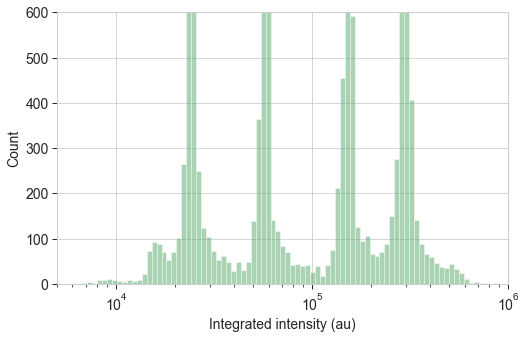

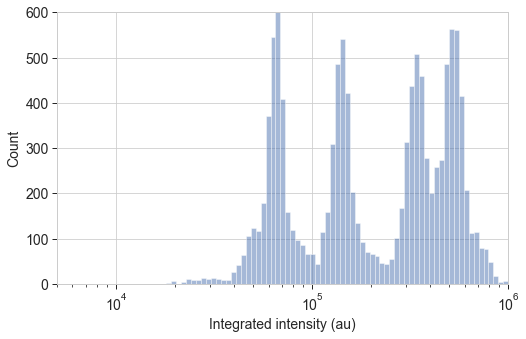

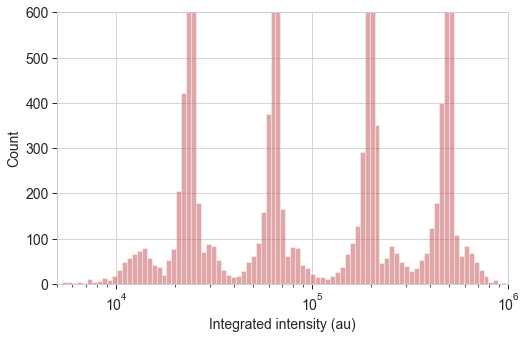

In [53]:
ymax = 600
bins = np.logspace(3.5, 6, 100)
for chan in ("green", "blue", "red"):
    plot_histogram(df_beads[f"Intensity_IntegratedIntensity_{chan}"], color=chan[0], ymax=ymax, bins=bins)

## Multi-color controls

***Warning!*** CellProfiler scales intensities to the range [0,1]. The beads are processed outside of CellProfiler and retain intensity values between 0 and 65535. We're going to use [0,65535].

In [54]:
path = "/home/lab/work/postdoc/communication/workspace/Kiwimagi06302020/2020125_verification"
file = "0630_multi_control_IdentifyPrimaryObjects.csv"
df_multi = pd.read_csv(os.path.join(path,file))

Max value is 1!

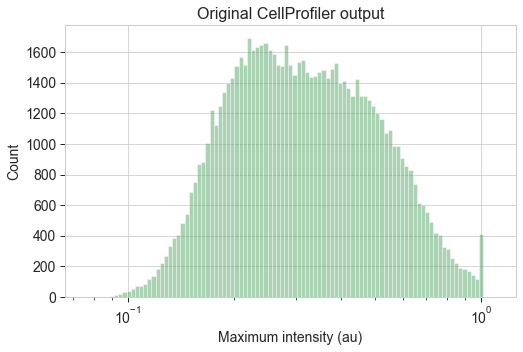

In [55]:
plot_histogram(df_multi['Intensity_MaxIntensity_green'], color='g', xlim=None, xlabel="Maximum intensity (au)")
plt.title("Original CellProfiler output")
pass

Scale everything by 65535 before loading into cytoflow.

In [56]:
tube_multi = flow.Tube(frame=df_multi[["Intensity_IntegratedIntensity_green",
                                       "Intensity_IntegratedIntensity_red",
                                       "Intensity_IntegratedIntensity_blue"]] * 65535)
import_op = flow.ImportOp(tubes=[tube_multi])
ex = import_op.apply()

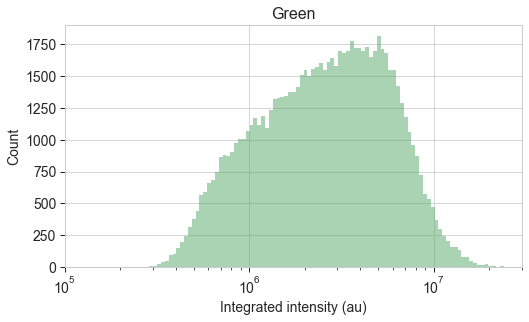

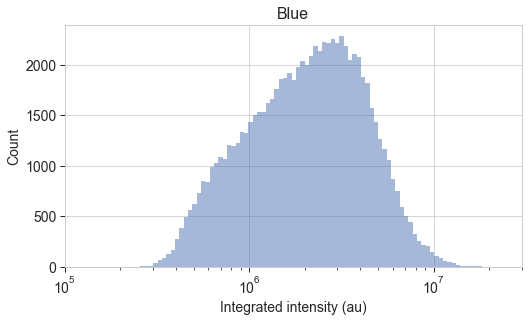

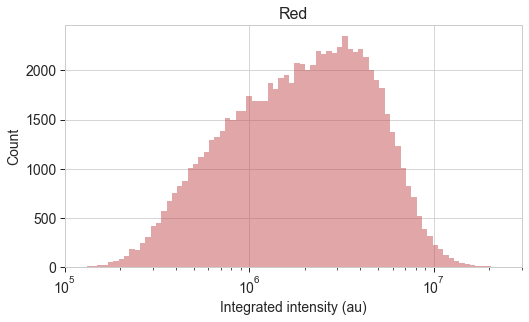

In [57]:
xlim = (1e5, 3e7)
xlabel = "Integrated intensity (au)"

for chan in ("green", "blue", "red"):
    flow.HistogramView(channel=f"Intensity_IntegratedIntensity_{chan}", scale="log").plot(ex, color=chan[0])
    plt.xlim(xlim)
    plt.title(chan.capitalize())
    plt.xlabel(xlabel)
    plt.gcf().set_size_inches(matplotlib.rcParams["figure.figsize"])

pass

## Background signal & autofluorescence

In FACS we measure cell autofluorescence. In microscopy, we have a large background signal and less sensitivity making autofluorescence unmeasurable. We don't even have to subtract the background signal, since it's present in the beads as well. We're going to plot histograms of the unsegmented wild-type wells for debug check purposes anyway.

In [58]:
path = "/home/lab/work/postdoc/communication/workspace/Kiwimagi06302020/CytationData/200701_101120_07.1/200701_101120_Plate 1"
im_wt = {
    'b': skimage.io.ImageCollection(os.path.join(path, "A5_02_*TagBFP*.tif")),
    'g': skimage.io.ImageCollection(os.path.join(path, "A5_02_*GFP*.tif")),
    'r': skimage.io.ImageCollection(os.path.join(path, "A5_02_*Texas Red*.tif"))
}

In [59]:
bad_idx = [0,1,6,7,8,15,16,23,31,39,47,48,55,56,62,63] + [29,34,37,]
idx = list(set(range(len(im_wt['b']))) - set(bad_idx))

In [60]:
df_wt = pd.DataFrame()
# Not really integrated instensity, we use these names just so the channels will match
for chan in ("green", "blue", "red"):
    c = chan[0]
    df_wt[f"Intensity_IntegratedIntensity_{chan}"] = np.vstack([im_wt[c][i]/norm[c] for i in idx]).flatten()

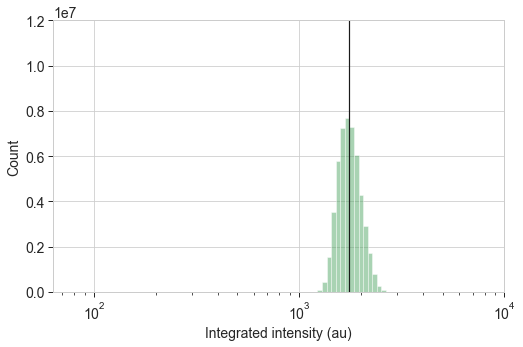

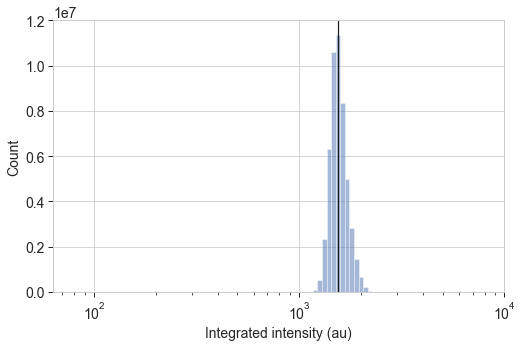

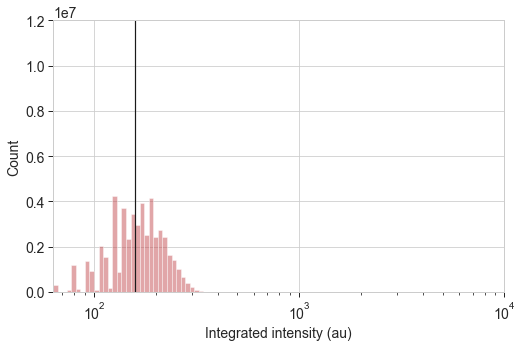

In [61]:
xmine = 1.8
xmaxe = 4.0
bins = np.logspace(xmine, xmaxe, 100)
background = {}
for chan in ("green", "blue", "red"):
    c = chan[0]
    data = df_wt[f"Intensity_IntegratedIntensity_{chan}"]
    mask = data[data > 0.0]
    plot_histogram(mask, color=c, xlim=(10**(xmine), 10**(xmaxe)), bins=bins, ymax=1.2e7)
    gm = gmean(mask)
    background[c] = gm
    plt.axvline(gm, color='k')
    plt.show()

In [62]:
print(background)

{'g': 1749.9589669963514, 'b': 1552.4965355342845, 'r': 157.55810518190523}


## Bleedthrough

***Warning!*** CellProfiler scales intensities to the range [0,1]. The beads are processed outside of CellProfiler and retain intensity values between 0 and 65535. We're going to use [0,65535].

In [63]:
path = "/home/lab/work/postdoc/communication/workspace/Kiwimagi06302020/"
df_single = {
    'r': pd.read_csv(os.path.join(path, "red_control_a_IdentifyPrimaryObjects.csv")),
    'g': pd.read_csv(os.path.join(path, "green_control_a_IdentifyPrimaryObjects.csv")),
    'b': pd.read_csv(os.path.join(path, "blue_control_a_IdentifyPrimaryObjects.csv")),
}

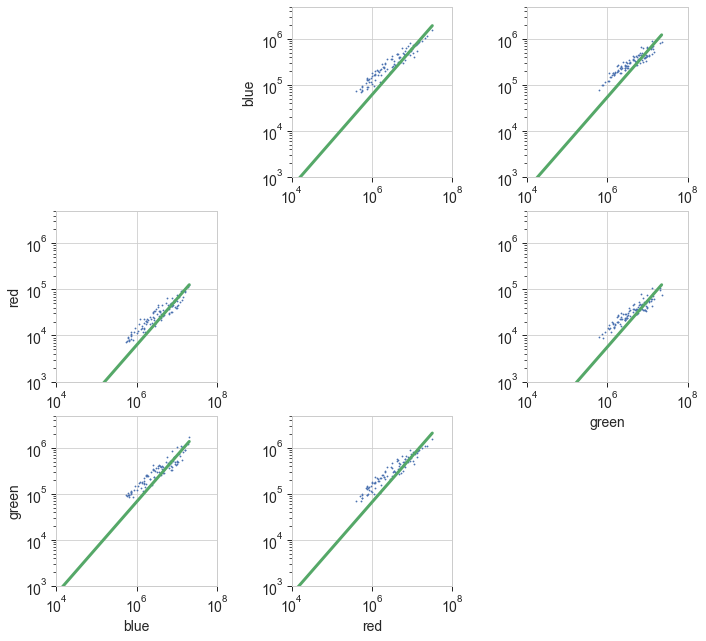

In [64]:
#bl_op = flow.BleedthroughPiecewiseOp()
#bl_op.ignore_deprecated = True
bl_op = flow.BleedthroughLinearOp()

# hack to prevent Logicle scale
if "cytoflow.utility.logicle_ext.Logicle" in sys.modules:
    del sys.modules["cytoflow.utility.logicle_ext.Logicle"]

controls = {
    'Intensity_IntegratedIntensity_green' : df_single['g']*65535,
    'Intensity_IntegratedIntensity_blue'  : df_single['b']*65535,
    'Intensity_IntegratedIntensity_red'   : df_single['r']*65535
}


bl_op.controls_frames = controls

#import pdb
#pdb.set_trace()
bl_op.estimate(ex)
bl_op.default_view().plot(ex)
plt.gcf().set_size_inches(10, 10)
plt.subplots_adjust(hspace=0.2)
ax = plt.gcf().get_axes()
for a in ax:
    a.yaxis.set_major_locator(LogLocator())
    a.set_xscale("log")
    a.set_yscale("log")
    a.set_xlim(1e4, 1e8)
    a.set_ylim(1e3, 5e6)
    a.set_xlabel(a.get_xlabel().replace("Intensity_IntegratedIntensity_", ""))
    a.set_ylabel(a.get_ylabel().replace("Intensity_IntegratedIntensity_", ""))
ex_bl = bl_op.apply(ex)

## Bead calibration

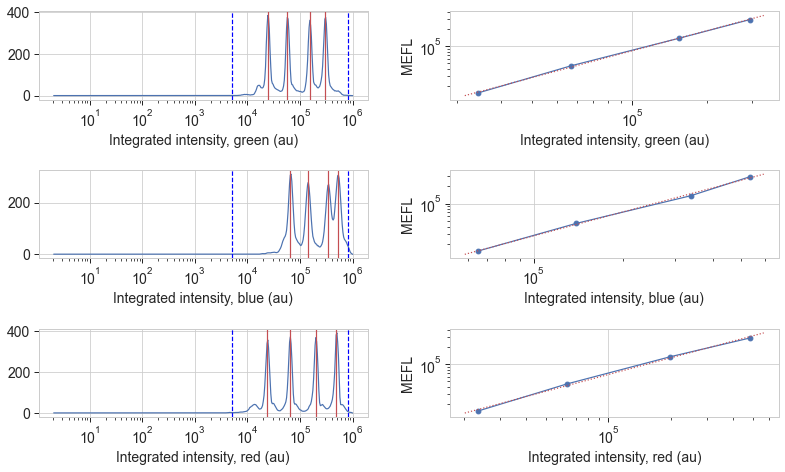

In [65]:
bead_op = flow.BeadCalibrationOp()
bead_op.beads = flow.BeadCalibrationOp.BEADS["Spherotech RCP-30-5A Lot AK02, AK03, AK04"]
bead_op.units = {
    "Intensity_IntegratedIntensity_green": "MEFL",
    "Intensity_IntegratedIntensity_blue" : "MEFL",
    "Intensity_IntegratedIntensity_red"  : "MEFL"
}

bead_op.bead_brightness_threshold = 5e3
bead_op.bead_brightness_cutoff = 8e5
bead_op.bead_histogram_bins = 400
bead_op.beads_frame = df_beads
bead_op.beads_n_subsets_search = False # assume highest au peak is highest MEFL peak
bead_op.estimate(ex_bl)

bead_op.default_view().plot(ex_bl)
for a in plt.gcf().get_axes():
    lx = a.get_xlabel()
    ly = a.get_ylabel()
    p = r"Intensity_(\w+)Intensity_(\w+)"
    r = r"\1 intensity, \2 (au)"
    lx = re.sub(p, r, lx)
    ly = re.sub(p, r, ly)
    a.set_xlabel(lx)
    a.set_ylabel(ly)
ex_beads = bead_op.apply(ex_bl)
plt.gcf().set_size_inches(7*golden)
plt.subplots_adjust(hspace=0.8, wspace=0.25)

In [66]:
bead_op.beads["MEFL"]

[771.0, 2106.0, 6262.0, 15183.0, 45292.0, 136258.0, 291042.0]

## Color map

In [67]:
path = '/home/lab/work/postdoc/communication/workspace/Kiwimagi06302020/'
file = 'multi_control_a_IdentifyPrimaryObjects.csv'
df_multi = pd.read_csv(os.path.join(path, file))

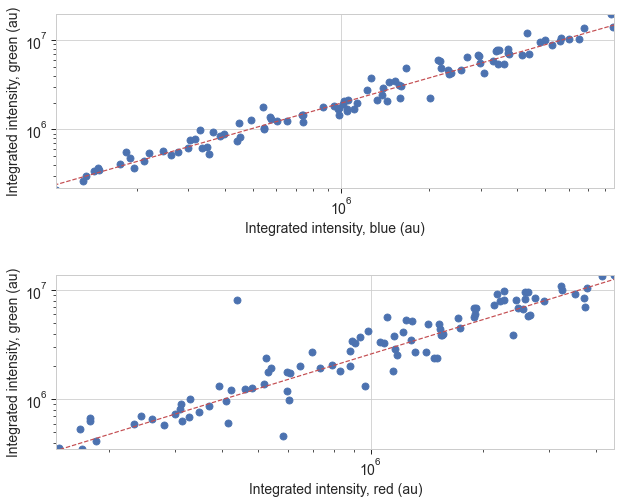

In [68]:
ct_op = flow.ColorTranslationOp()
ct_op.controls_frames = {("Intensity_IntegratedIntensity_blue", "Intensity_IntegratedIntensity_green"): df_multi*65535,
                         ("Intensity_IntegratedIntensity_red", "Intensity_IntegratedIntensity_green") : df_multi*65535}
ct_op.mixture_model = False

ct_op.estimate(ex_beads)
ct_op.default_view().plot(ex_beads)
ex_calib = ct_op.apply(ex_beads)

for a in plt.gcf().get_axes():
    #set_font_size(a)
    #a.get_legend().remove()
    lx = a.get_xlabel()
    ly = a.get_ylabel()
    p = r"Intensity_(\w+)Intensity_(\w+)"
    r = r"\1 intensity, \2 (au)"
    lx = re.sub(p, r, lx)
    ly = re.sub(p, r, ly)
    a.set_xlabel(lx)
    a.set_ylabel(ly)

plt.gcf().set_size_inches(10, 8)
plt.subplots_adjust(hspace=0.5)
pass

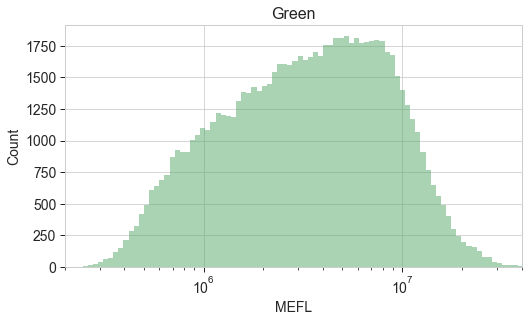

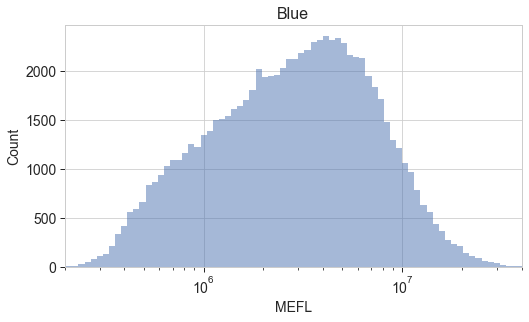

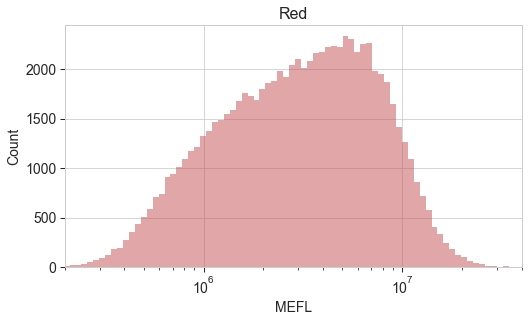

In [69]:
xlim = (2e5, 4e7)
xlabel = "MEFL"

for chan in ("green", "blue", "red"):
    flow.HistogramView(channel=f"Intensity_IntegratedIntensity_{chan}", scale="log").plot(ex_calib, color=chan[0])
    plt.xlim(xlim)
    plt.title(chan.capitalize())
    plt.xlabel(xlabel)
    plt.gcf().set_size_inches(matplotlib.rcParams["figure.figsize"])

pass

In [70]:
with open("/home/lab/work/postdoc/communication/workspace/Kiwimagi06302020/0630_ex_calib_data.pickle", 'wb') as fp:
    pickle.dump(ex_calib.data, fp)